In [4]:
import numpy as np
import pandas as pd

# 1. Data cleaning

#### Anonimyze comment data and only keep number of characters

## 1.1 Loading the data

In [5]:
comments = comments = pd.read_csv('data/anon_comments.csv')
comments.head(3)


,Unnamed: 0,employee,companyAlias,commentId,comment,likes,dislikes,commentDate
0,0,307,56aec740f1ef260003e307d6,58d018d7e010990004e38070,**********************************************...,4.0,0.0,Mon Mar 20 19:00:17 CET 2017
1,1,382,56aec740f1ef260003e307d6,58d0179ae010990004e3806d,*****************************,1.0,2.0,Mon Mar 20 18:55:16 CET 2017
2,2,172,56aec740f1ef260003e307d6,58cff8cde010990004e37f6a,***************************,3.0,0.0,Mon Mar 20 16:44:02 CET 2017


In [4]:
lastpart = pd.read_csv('data/lastParticipationExists.csv').drop_duplicates()
lastpart.head(3)


,employee,companyAlias,numVotes,lastParticipationDate,stillExists
0,512,56aec740f1ef260003e307d6,4,Thu Feb 23 12:48:04 CET 2017,True
1,-2,56aec740f1ef260003e307d6,0,Wed Jan 18 14:00:55 CET 2017,False
2,2,56aec740f1ef260003e307d6,72,Fri Mar 17 01:00:00 CET 2017,True


In [5]:
votes = pd.read_csv('data/votes.csv',parse_dates=True,dayfirst=True).drop_duplicates()
votes.head(3)


,employee,companyAlias,voteDate,vote
0,31,56aec740f1ef260003e307d6,Mon Feb 01 01:00:00 CET 2016,4
1,33,56aec740f1ef260003e307d6,Mon Feb 01 01:00:00 CET 2016,4
2,79,56aec740f1ef260003e307d6,Mon Feb 01 01:00:00 CET 2016,4


In [6]:
inters = pd.read_csv('data/commentInteractions.csv').dropna(how='any').drop_duplicates()
inters.head(3)

/home/kalidus/anaconda3/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,employee,companyAlias,liked,disliked,commentId
0,307,56aec740f1ef260003e307d6,True,False,58d018d7e010990004e38070
1,36,56aec740f1ef260003e307d6,True,False,58d018d7e010990004e38070
2,276,56aec740f1ef260003e307d6,True,False,58d018d7e010990004e38070


## 1.2 Getting first dates and last dates of employee interactions

Convert strings representing dates to datetime objects.

In [7]:
lastpart['lastParticipationDate'] = lastpart['lastParticipationDate'].map(pd.to_datetime)
comments['commentDate'] = comments['commentDate'].map(pd.to_datetime)
votes['voteDate'] = votes['voteDate'].map(pd.to_datetime)

Get the first date an employee started using the app. I takes into account the first vote, the first comment written, and the first like/dislike, whatever it happened first.

In [15]:
min_date_comment = pd.DataFrame(comments.groupby(['companyAlias','employee'])['commentDate'].apply(np.min))
min_date_votes = pd.DataFrame(votes.groupby(['companyAlias','employee'])['voteDate'].apply(np.min))
min_date_part = pd.DataFrame(lastpart.groupby(['companyAlias','employee'])['lastParticipationDate'].min())
min_dates = pd.merge(min_date_comment,min_date_votes,right_index=True,left_index=True,how='outer')
min_dates = pd.merge(min_dates,min_date_part,right_index=True,left_index=True,how='outer')
first_dates = pd.DataFrame(min_dates.fillna(method='ffill',axis=1).fillna(method='bfill',axis=1).min(axis=1),columns=['first_date'])
first_dates.head(3)

first_date
companyAlias             employee                    
5370af43e4b0cff95558c12a -117     2016-03-04 09:55:34
                         -116     2016-09-12 11:53:45
                         -115     2016-09-12 11:54:00

Now we create a DataFrame containing the first date of app usage, the last date an employee used the app, and  a column that indicates if the user is still registered in the app.

In [20]:
last_dates = lastpart.set_index(['companyAlias','employee'])[['lastParticipationDate','stillExists']].copy()
dates = pd.merge(first_dates,last_dates,right_index=True,left_index=True,how='outer')
dates.ix[-5:-1].head()

first_date lastParticipationDate stillExists
companyAlias             employee                                             
58c6e15f32f72a00046f556c 58       2017-03-14   2017-03-14 23:13:43        True
                         59       2017-03-14   2017-03-14 23:13:43        True
                         60       2017-03-14   2017-03-20 14:29:20        True
                         61       2017-03-14   2017-03-14 23:13:43        True

## 1.3 Filtrering employees

- We delete employees churned before 30 june 2016 (arbtrary prediction date).
- We delete employees that started using the app after the prediction date.


In [21]:
prediction_date = '26 Dec 2016'
data_collection_ended = '20 March 2017'
last_dates['lastParticipationDate'].max()

Timestamp('2017-03-20 20:25:54')

In [22]:
c_first = dates['first_date']<=pd.to_datetime(prediction_date)
c_last = dates['lastParticipationDate']>pd.to_datetime(prediction_date)
dates[c_first&c_last]['stillExists'].value_counts()

True     1851
False     226
Name: stillExists, dtype: int64

## 1.4 Creating the churn variable

The churn feature will be 1 if a user churned after the prediction date. We also remove useres churned before prediction date.


In [31]:
users_index = dates[c_first&c_last].copy()

ce = users_index['stillExists'] == False
cd = users_index['lastParticipationDate']<pd.to_datetime(data_collection_ended)
#remove churned before pred. date
bad = users_index['lastParticipationDate']<pd.to_datetime(prediction_date)
users_index = users_index.loc[np.logical_not(bad)].copy()

users_index['churn'] = False
users_index.loc[ce&cd,'churn'] = True

users_index['churn'] = users_index['churn'].map(lambda x: int(x))
users_index.loc[np.logical_not(ce&cd)].shape,users_index[ce&cd].shape


((1868, 4), (209, 4))

## 1.5 Filter the original data to keep only valid ML employees

Keep only data generated by valid employees found in the users_index DataFrame.

In [51]:
alias_comp = dict([(x,i) for i,x in enumerate(np.unique(users_index.index.levels[0].values).tolist())])
users_index['comp_short'] = users_index.reset_index()['companyAlias'].map(lambda x: alias_comp[x]).values

valid_users = [(a,b) for a,b in users_index.reset_index()[['companyAlias','employee']].values.tolist()]

def filter_users(x):
    if (x['companyAlias'],x['employee']) in valid_users:
        return True
    else:
        return False

coms_ix = comments.apply(filter_users,axis=1)
lastp_ix = lastpart.apply(filter_users,axis=1)
votes_ix = votes.apply(filter_users,axis=1)
ints_ix = inters.apply(filter_users,axis=1)

inters_clean = inters[ints_ix].copy()
votes_clean = votes[votes_ix].copy()
coms_clean = comments[coms_ix].copy()
lastp_clean = lastpart[lastp_ix].copy()

## 1.6 Create UIDs for every employee

We map hash values to numeric values and create a unique identifier for each employee

In [54]:
def make_uid(x):
    df = x.reset_index().copy()
    return df['companyAlias'].map(lambda x: str(alias_comp[x])).values+'_'+df['employee'].map(str).values
users_index['uid'] = make_uid(users_index)
inters_clean['uid'] = make_uid(inters_clean)
inters_clean['comid'] = inters_clean['uid'].map(lambda x: x.split('_')[0]).values
votes_clean['uid'] = make_uid(votes_clean)
votes_clean['comid'] = votes_clean['uid'].map(lambda x: x.split('_')[0]).values
coms_clean['uid'] = make_uid(coms_clean)
coms_clean['comid'] = coms_clean['uid'].map(lambda x: x.split('_')[0]).values
lastp_clean['uid'] = make_uid(lastp_clean)
lastp_clean['comid'] = lastp_clean['uid'].map(lambda x: x.split('_')[0]).values
#in case you want to do inverse hashing
inv_comp = dict([(val,key) for key,val in alias_comp.items()])
def inv_company(x):
    c = x.split('_')[0]
    return inv_comp[int(c)]
    

## 1.7 Keep only data belonging to observation period

We make sure once more that we are only working with data belonging to observation period

In [55]:
#comments before 26 December 2016
coms_clean = coms_clean[coms_clean['commentDate']<=pd.to_datetime(prediction_date)].copy()
comment_ids = coms_clean['commentId'].unique().tolist()
valid_com = lambda x: x in comment_ids
inters_clean = inters_clean[inters_clean['commentId'].map(valid_com)].copy()

In [56]:

coms_clean = coms_clean[coms_clean['commentDate']<=pd.to_datetime(prediction_date)].copy()
comment_ids = coms_clean['commentId'].unique().tolist()
valid_com = lambda x: x in comment_ids
inters_clean = inters_clean[inters_clean['commentId'].map(valid_com)].copy()
votes_clean = votes_clean[votes_clean['voteDate']<=pd.to_datetime(prediction_date)].copy()

## 1.8 Delete duplicates

In [57]:
coms_clean = coms_clean.drop_duplicates()
votes_clean = votes_clean.drop_duplicates()
inters_clean = inters_clean.drop_duplicates()
lastp_clean = lastp_clean.drop_duplicates()
users_index = users_index.drop_duplicates()

# 2 Calculate employee features

We will only keep users with a minimum number of interactions recorded. So we now calculate the employee features to filter the data later.

## 2.1 vote features

In [40]:

vote_feats = votes_clean.groupby(['uid'])['vote'].agg({'votes_1': lambda x: len(x[x==1]),
                                                        'votes_2': lambda x: len(x[x==2]),
                                                        'votes_3': lambda x: len(x[x==3]),
                                                        'votes_4': lambda x: len(x[x==4]),
                                                        'votes_mean': lambda x: x.mean(),
                                                        'votes_std': lambda x: x.std(),
                                                       'votes_num': lambda x: len(x),
                                                       }).copy().fillna(0)

## 2.2 Comments features

In [41]:
likes_feats = coms_clean.groupby(['uid'])['likes'].agg({
                                          'likes_mean': lambda x: len(x),
                                          'likes_std': lambda x: x.std(),
                                          'likes_sum': lambda x: x.sum(),
                                                       })
dislikes_feats = coms_clean.groupby(['uid'])['dislikes'].agg({
                                          'dislikes_mean': lambda x: len(x),
                                          'dislikes_std': lambda x: x.std(),
                                          'dislikes_sum': lambda x: x.sum(),
                                                       })
coms_feats = coms_clean.dropna().groupby(['uid'])['comment'].agg({'com_num': lambda x: len(x),
                                                             'com_mean': lambda x: x.apply(len).mean(),
                                                             'com_std': lambda x: x.map(len).std(),
                                                             'com_sum': lambda x: x.map(len).sum()})

## 2.3 Merge all the features

In [42]:
features = pd.merge(vote_feats,likes_feats,left_index=True,right_index=True,how='outer')
features = pd.merge(features,dislikes_feats,left_index=True,right_index=True,how='outer')
features = pd.merge(features,coms_feats,left_index=True,right_index=True,how='outer')
features = pd.merge(features,users_index.set_index('uid')[['churn','comp_short']],left_index=True,right_index=True,how='left').fillna(0)#fill users with 0 comments
features.rename(columns={'comp_short':'comid'},inplace=True)
E_features = features.copy()
E_features.rename(columns=dict([(x,'E_'+str(x)) for x in E_features.columns]),inplace=True)


## 2.4 Only employees with more than 5 votes and interactions

This is the last step of our cleaning process. We will only keep users that meet the following criteria:

- **Has more than 5 votes recorded during observation period.**
- **The number of likes and dislikes recorded is at least 5.**

In [43]:
has_votes = E_features['E_votes_num']>=5
has_likes = (E_features['E_likes_sum']+E_features['E_dislikes_sum'])>=5
valid_uids = E_features[has_likes&has_votes].index.values.tolist()
E_features = E_features[has_likes&has_votes].copy()
has_votes = features['votes_num']>=5
has_likes = (features['likes_sum']+features['dislikes_sum'])>=5
features = features[has_likes&has_votes].copy()
valid_uid = lambda x: x in valid_uids

In [44]:
coms_clean = coms_clean[coms_clean['uid'].map(valid_uid)].drop_duplicates()
votes_clean = votes_clean[votes_clean['uid'].map(valid_uid)].drop_duplicates()
inters_clean = inters_clean[inters_clean['uid'].map(valid_uid)].drop_duplicates()
lastp_clean = lastp_clean[lastp_clean['uid'].map(valid_uid)].drop_duplicates()
users_index = users_index[users_index['uid'].map(valid_uid)].drop_duplicates()


## 2.5 Save the filtered data

Finally, we saved our machine learning data for further use.

In [58]:
inters_clean.to_csv('cleaned_data/interactions_ml.csv')
votes_clean.to_csv('cleaned_data/votes_ml.csv')
coms_clean.to_csv('cleaned_data/comments_ml.csv')
lastp_clean.to_csv('cleaned_data/lastpart_ml.csv')
users_index.to_csv('cleaned_data/target.csv')

In [23]:
valid_uids[:4]

['0_18', '0_21', '0_25', '0_259']

In [24]:
linking 20844 comments from 1271 users

SyntaxError: invalid syntax (<ipython-input-24-f5e56b8087ad>, line 1)

F# Name of Feature: Description of feature
Group
Influence*
F1 Indiviual Likability: Count of likes received / (count of likes + count of dislikes) on the all the comments written by the employee in the anonymous forum.
E
33
F2 Posting frequency: Average comments per day per employee (company wide feature)
C
9.6
F3 Relative Happiness: Employee mean happines vote/company average happiness
E/C
4.2
F4 Relative Variability of Happiness: Standard devition of employee happiness / standard deviation of the company to which the emplyee belongs
E/C
2.4
F5 Clustering of employees according to their interactions of the undirected graph of likes and dislike in the forum (clustering according to common likes of employees in the forum)
NFM
2.2
F6 Mean Happiness of the employee
E
1.8
Fin de la conversación de chat
Escribe un mensaje...



In [38]:
users_index['first_date'].min()-users_index['lastParticipationDate'].max()

Timedelta('-774 days +03:39:45')

In [41]:
users_index['churn'].value_counts()

0    1234
1      43
Name: churn, dtype: int64

# 3 Graph features

In this paper, we describe how to rank employees by risk of churn by using data obtained from a happiness  self-reporting app. Two data sources are used: the employee daily happiness level and, social interactions  from an anonymous in-company feedback forum. The data spans 2 years and 1271 employees of 22 companies.  We develop churn risk models and we compare how  different features influence the churn precision.  For  each employee,  we  build  various groups of features at variouslevels: individual features, company level features and social group level features. The results show that the most useful feature for churn prediction  is  the number of likes of an user divided by the number of likes plus the number of dislikes (relative agreement). The best model achieved a precission  #SHOULD BE F1 SCORE OR AUC of    of  XX%# from  43  churned  employees. The top features where relative agreement, company number of employees, and employee happyness votes mean. A social interpretation is offered. Besides relative agreement, features that are relative to the group rather than absolute measures seem to be better predictors of churn.  

## 3.1 Create a database-wide interactions graph

In [46]:
import networkx as nx
def link_all(users_index,comments,inter):
    g = nx.DiGraph()
    #Create nodes with hierarchy info when available, 'ZZZ' otherwise
    for ix,x in users_index.iterrows():
        if not g.has_node(x['uid']):
            c,u = x['uid'].split('_')
            g.add_node(x['uid'],company=c,employee=u)

    com_ids = comments['commentId'].unique()
    users = comments['uid'].unique().tolist()
    print("linking {} comments from {} users".format(len(com_ids),len(users)))
    for com in com_ids:
        writer = comments[comments['commentId']==com]['uid'].values[0]
        df = inter[inter['commentId']==com]

        haters = df[df['liked']==0]['uid'].values.copy().tolist()
        likers = df[df['liked']==1]['uid'].values.copy().tolist()
        for i,u in enumerate(likers):
 
            if not g.has_edge(u,writer):
                g.add_edge(u,writer,int_sum=1,interactions=1,liked=1,disliked=0)
            else:
                g.edge[u][writer]['interactions'] += 1
                g.edge[u][writer]['int_sum'] += 1
                g.edge[u][writer]['liked'] += 1

        for i,u in enumerate(haters):

            if not g.has_edge(u,writer):
                g.add_edge(u,writer,int_sum=-1,interactions=1,liked=0,disliked=1)
            else:
                g.edge[u][writer]['interactions'] += 1
                g.edge[u][writer]['disliked'] += 1
                g.edge[u][writer]['int_sum'] -= 1


    return g     

In [47]:
def add_info_to_graph(features,G):
    for n in G.nodes_iter():
        try:
            fs = features.ix[n].to_dict()
            #fs['hierarchy'] = graphs[comp].node[n]['hierarchy']
            G.add_node(n,**fs)
        except:
            print(n,comp,fs)
            raise
    return G

def add_rel_likes_metrics(g):
    for src in g.nodes_iter():
        t_rel = 0
        neigh = nx.neighbors(g,src)
        f = 1 if len(neigh)==0 else len(neigh)
        for dst in neigh:
            rel = g.edge[src][dst]['liked']/g.edge[src][dst]['interactions']
            g.edge[src][dst]['rel_agree'] = rel
            t_rel += rel
        g.node[src]['mean_agree'] = t_rel/f

def calculate_metrics(g,metrics,weight=None):
    graph_df = pd.DataFrame()
    nw =  '' if weight is None else weight+'_'
    for met in metrics:
        graph_df['G_'+nw+met.__name__] = pd.Series(met(g))
        graph_df['G_'+nw+'w_'+met.__name__] = pd.Series(met(g,weight=weight))
        graph_df['G_'+nw+met.__name__+'_u'] = pd.Series(met(g.to_undirected()))
        graph_df['G_'+nw+'w_'+met.__name__+'_u'] = pd.Series(met(g.to_undirected(),weight=weight))
    """graph_df.index.name = 'employee'
    graph_df['companyAlias'] = companyAlias
    graph_df = graph_df.reset_index()
    graph_df = graph_df.set_index(['companyAlias','employee'])"""
    #old_index = graph_df.index.copy()
    graph_df = (graph_df-graph_df.min(axis=0))/(graph_df.max(axis=0)-graph_df.min(axis=0))
    #graph_df = graph_df.reset_index()
    #graph_df.index = old_index
    return graph_df

from sklearn.decomposition import NMF
def get_clusters(g, weight=None,companyAlias=''):
    nw =  '' if weight is None else weight+'_'
    model = NMF(n_components=2)
    X = nx.adjacency_matrix(g,weight=weight).todense()
    if (X < 0).any():
        X = np.abs(X)
    communities = model.fit_transform(X)
    cd = pd.DataFrame(index=list(g.nodes_iter()),columns=['G_'+nw+'NMF1_d','G_'+nw+'NMF2_d'],data=communities)
    
    Xd = nx.adjacency_matrix(g.to_undirected(),weight=weight).todense()
    if (Xd < 0).any():
        Xd = np.abs(Xd)
    communities = model.fit_transform(Xd)
    clusters = cd.combine_first(pd.DataFrame(index=cd.index,columns=['G_'+nw+'NMF1_u','G_'+nw+'NMF2_u'],data=communities))
    """clusters['companyAlias'] = companyAlias
    clusters.index.name = 'employee'
    clusters = clusters.reset_index()
    clusters = clusters.set_index(['companyAlias','employee'])"""
    return clusters 

In [48]:
def calculate_graph_features(G,features):
    add_rel_likes_metrics(G)
    ng = add_info_to_graph(features=features,G=G.copy())
    
    met_funcs = [nx.degree, nx.betweenness_centrality]
    graph_met_rel = calculate_metrics(ng,met_funcs,weight='rel_agree')
    cluster_rel = get_clusters(ng,weight='rel_agree')
    agree_feats = pd.merge(graph_met_rel,cluster_rel,left_index=True,right_index=True,how='outer')
    graph_met_int = calculate_metrics(ng,met_funcs,weight='interactions')
    cluster_int = get_clusters(ng,weight='interactions')
    int_feats = pd.merge(graph_met_int,cluster_int,left_index=True,right_index=True,how='outer')
    graph_feats = pd.merge(int_feats,agree_feats,left_index=True,right_index=True,how='outer')
    #final_features = pd.merge(features,graph_feats,left_index=True,right_index=True,how='outer')
    ng = add_info_to_graph(features=graph_feats,G=ng.copy())
    
    return graph_feats,ng

In [49]:
G_raw = link_all(users_index,coms_clean,inters_clean)

linking 20844 comments from 1271 users


In [29]:
E_G_features,g_total = calculate_graph_features(G_raw.copy(),features)

E_G_features.head()

,G_interactions_degree,G_interactions_w_degree,G_interactions_degree_u,G_interactions_w_degree_u,G_interactions_betweenness_centrality,G_interactions_w_betweenness_centrality,G_interactions_betweenness_centrality_u,G_interactions_w_betweenness_centrality_u,G_interactions_NMF1_d,G_interactions_NMF1_u,...,G_rel_agree_degree_u,G_rel_agree_w_degree_u,G_rel_agree_betweenness_centrality,G_rel_agree_w_betweenness_centrality,G_rel_agree_betweenness_centrality_u,G_rel_agree_w_betweenness_centrality_u,G_rel_agree_NMF1_d,G_rel_agree_NMF1_u,G_rel_agree_NMF2_d,G_rel_agree_NMF2_u
0_18,0.148551,0.105798,0.136905,0.142361,0.030847,0.031523,0.032170,0.001964,0.0,0.0,...,0.136905,0.167276,0.030847,9.500184e-09,0.032170,7.168175e-24,0.0,0.0,0.0,0.0
0_21,0.079710,0.013629,0.089286,0.014323,0.002755,0.044845,0.004750,0.041946,0.0,0.0,...,0.089286,0.110892,0.002755,1.468868e-09,0.004750,9.711716e-24,0.0,0.0,0.0,0.0
0_25,0.108696,0.047124,0.119048,0.065104,0.008813,0.031854,0.017424,0.019217,0.0,0.0,...,0.119048,0.139991,0.008813,2.635093e-09,0.017424,8.861263e-24,0.0,0.0,0.0,0.0
0_259,0.105072,0.029106,0.119048,0.039062,0.012737,0.044610,0.021450,0.102075,0.0,0.0,...,0.119048,0.141728,0.012737,1.062756e-08,0.021450,4.232589e-23,0.0,0.0,0.0,0.0
0_26,0.025362,0.002772,0.035714,0.004340,0.000126,0.000000,0.000000,0.005483,0.0,0.0,...,0.035714,0.048053,0.000126,0.000000e+00,0.000000,0.000000e+00,0.0,0.0,0.0,0.0


# 3. Company features

In [30]:

comp_vote_feats = votes_clean.groupby(['comid'])['vote'].agg({'votes_1': lambda x: len(x[x==1]),
                                                        'votes_2': lambda x: len(x[x==2]),
                                                        'votes_3': lambda x: len(x[x==3]),
                                                        'votes_4': lambda x: len(x[x==4]),
                                                        'votes_mean': lambda x: x.mean(),
                                                        'votes_std': lambda x: x.std(),
                                                       'votes_num': lambda x: len(x),
                                                       }).copy()

## 2.2 Comments features

In [31]:
comp_likes_feats = coms_clean.groupby(['comid'])['likes'].agg({
                                          'likes_mean': lambda x: len(x),
                                          'likes_std': lambda x: x.std(),
                                          'likes_sum': lambda x: x.sum(),
                                                       })
comp_dislikes_feats = coms_clean.groupby(['comid'])['dislikes'].agg({
                                          'dislikes_mean': lambda x: len(x),
                                          'dislikes_std': lambda x: x.std(),
                                          'dislikes_sum': lambda x: x.sum(),
                                                       })
comp_coms_feats = coms_clean.dropna().groupby(['comid'])['comment'].agg({'com_num': lambda x: len(x),
                                                             'com_mean': lambda x: x.apply(len).mean(),
                                                             'com_std': lambda x: x.map(len).std(),
                                                             'com_sum': lambda x: x.map(len).sum()})

In [32]:
comp_features = pd.merge(comp_vote_feats,comp_likes_feats,left_index=True,right_index=True,how='outer')
comp_features = pd.merge(comp_features,comp_dislikes_feats,left_index=True,right_index=True,how='outer')
comp_features = pd.merge(comp_features,comp_coms_feats,left_index=True,right_index=True,how='outer')
#features = pd.merge(features,users_index.set_index('uid')[['churn']],left_index=True,right_index=True,how='left')
#features.set_index('uid'),'ui
comp_df = comp_features.fillna(1)
comp_df = comp_df.applymap(lambda x: 1 if x==0 else x)
C_featues = comp_df.copy()

# 4 Employee-Company features

## 4.1 realtive employee features

In [33]:
rel_feats = features[comp_df.columns.values.tolist()+['comid']].copy()
companies = comp_df.index.values.tolist()
for comp in companies:
    rel_feats.loc[rel_feats['comid']==int(comp)] = rel_feats.loc[rel_feats['comid']==int(comp)]/comp_df.ix[comp]
rel_feats.drop('comid',axis=1,inplace=True)

rel_feats.rename(columns=dict([(x,'CE_'+str(x)) for x in rel_feats.columns]),inplace=True)

CE_features = rel_feats.copy()

## 4.2 relative graph features

In [34]:
rel_feats['comid'] = E_features['E_comid'].copy()

In [51]:
features[features['comid']==int(comp)].copy().head()

,votes_std,votes_3,votes_2,votes_1,votes_mean,votes_4,votes_num,likes_std,likes_mean,likes_sum,dislikes_mean,dislikes_std,dislikes_sum,com_sum,com_mean,com_num,com_std,churn,comid
uid,,,,,,,,,,,,,,,,,,,
6_1,0.912505,63.0,19.0,14.0,3.247368,94.0,190.0,5.048061,177.0,827.0,177.0,1.907127,270.0,6693.0,38.687861,173.0,52.627428,0,6
6_10,0.509687,16.0,53.0,2.0,2.222222,1.0,72.0,7.704977,6.0,41.0,6.0,3.265986,14.0,735.0,122.500000,6.0,177.933415,0,6
6_101,0.525809,75.0,2.0,0.0,3.509317,84.0,161.0,3.214550,3.0,32.0,3.0,0.577350,2.0,237.0,79.000000,3.0,84.787971,0,6
6_102,0.597101,52.0,40.0,4.0,2.515464,1.0,97.0,6.773388,12.0,76.0,12.0,1.537412,12.0,588.0,49.000000,12.0,47.462904,0,6
6_11,0.555163,67.0,4.0,0.0,3.460432,68.0,139.0,7.864911,138.0,1721.0,138.0,3.000097,221.0,18639.0,135.065217,138.0,127.606730,0,6


In [52]:
g_comps = {}
comp = companies[0]
ui = users_index[users_index['comp_short']==int(comp)].copy()
co = coms_clean[coms_clean['comid']==comp].copy()
ints = inters_clean[inters_clean['comid']==comp].copy()
g_c = link_all(ui,co,ints)
if g_c.node!={}:
    g_comps[comp] = g_c
    _features,g_c = calculate_graph_features(g_c,rel_feats[rel_feats['comid']==int(comp)].copy())
    rgdf = _features.copy()
for comp in companies[1:]:
    print("calculating comp : {}".format(comp))
    ui = users_index[users_index['comp_short']==int(comp)].copy()
    co = coms_clean[coms_clean['comid']==comp].copy()
    ints = inters_clean[inters_clean['comid']==comp].copy()
    g_c = link_all(ui,co,ints)
    if g_c.node!={}:
        _features,g_c = calculate_graph_features(g_c,rel_feats[rel_feats['comid']==int(comp)].copy())
        g_comps[comp] = g_c
        rgdf = pd.concat([rgdf,_features])

linking 396 comments from 24 users
calculating comp : 11
linking 3443 comments from 173 users
calculating comp : 12
linking 1124 comments from 43 users
calculating comp : 13
linking 553 comments from 27 users
calculating comp : 16
linking 1885 comments from 117 users
calculating comp : 17
linking 1010 comments from 55 users
calculating comp : 18
linking 1672 comments from 135 users
calculating comp : 19
linking 186 comments from 6 users
calculating comp : 20
linking 777 comments from 73 users
calculating comp : 21
linking 737 comments from 75 users
calculating comp : 22
linking 496 comments from 31 users
calculating comp : 23
linking 467 comments from 27 users
calculating comp : 24
linking 655 comments from 56 users
calculating comp : 25
linking 37 comments from 3 users
calculating comp : 26
linking 792 comments from 89 users
calculating comp : 29
linking 140 comments from 14 users
calculating comp : 3
linking 80 comments from 4 users
calculating comp : 30
linking 272 comments from 22 

In [53]:
CE_G_features.reset_index()['index'].map(inv_company).values

NameError: name 'CE_G_features' is not defined

In [54]:
CE_G_features = rgdf.rename(columns=dict([(x,'CE_'+str(x)) for x in rgdf.columns])).copy()

CE_G_features['companyAlias'] = CE_G_features.reset_index()['index'].map(inv_company).values
CE_G_features['employee'] = CE_G_features.reset_index()['index'].map(lambda x: x.split('_')[1]).values
CE_G_features.to_csv('CE_G_features.csv')

E_G_features['companyAlias'] = E_G_features.reset_index()['index'].map(inv_company).values
E_G_features['employee'] = E_G_features.reset_index()['index'].map(lambda x: x.split('_')[1]).values
E_G_features.to_csv('E_G_features.csv')

In [55]:
nmf_cols = [x  for x in CE_G_features.columns if 'NMF' in x]

In [56]:
NMF_df = CE_G_features[['companyAlias']+nmf_cols].copy()

In [70]:
r_NMFD = NMF_df.groupby(['companyAlias']).apply(lambda x: x.rank(na_option='bottom',axis=0)/x.rank(na_option='bottom',axis=0).max(axis=0)).copy().drop('companyAlias',axis=1)

In [71]:
clusters = r_NMFD.applymap(lambda x: pd.cut(x,bins=[-0.1,0.333,0.666,1.01],labels=False)).copy()

In [74]:
users_by_c = pd.merge(clusters,features,left_index=True,right_index=True,how='left')

In [81]:
%matplotlib inline
from matplotlib import pyplot as plt

In [90]:
users_by_c.columns.values

array(['CE_G_interactions_NMF1_d', 'CE_G_interactions_NMF1_u',
       'CE_G_interactions_NMF2_d', 'CE_G_interactions_NMF2_u',
       'CE_G_rel_agree_NMF1_d', 'CE_G_rel_agree_NMF1_u',
       'CE_G_rel_agree_NMF2_d', 'CE_G_rel_agree_NMF2_u', 'votes_std',
       'votes_3', 'votes_2', 'votes_1', 'votes_mean', 'votes_4',
       'votes_num', 'likes_std', 'likes_mean', 'likes_sum',
       'dislikes_mean', 'dislikes_std', 'dislikes_sum', 'com_sum',
       'com_mean', 'com_num', 'com_std', 'churn', 'comid'], dtype=object)

In [92]:
users_by_c['agree'] = users_by_c['likes_sum']/(users_by_c['likes_sum']+users_by_c['dislikes_sum'])

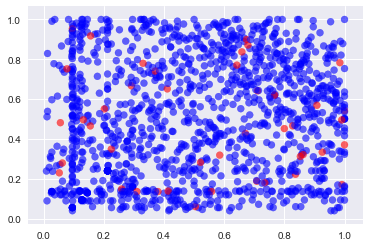

In [116]:
plt.scatter(r_NMFD['CE_G_rel_agree_NMF1_d'],r_NMFD['CE_G_rel_agree_NMF2_d'],color=users_by_c['churn'].map(lambda x: 'red' if x==1 else 'blue').values,alpha=0.6)

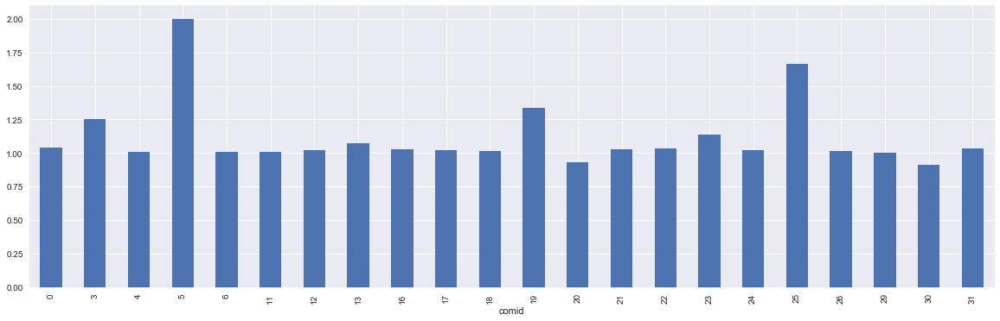

In [107]:
users_by_c.groupby(['comid'])['CE_G_interactions_NMF1_d'].mean().plot(kind='bar',figsize=(20,6))

# Evaluating feature importances

In [300]:

from imblearn.pipeline import make_pipeline
from imblearn.under_sampling import (EditedNearestNeighbours,
                                     RepeatedEditedNearestNeighbours)
from sklearn.preprocessing import StandardScaler
threshold = 0.02 #keep for ML importances above threshold
clf = DecisionTreeClassifier(criterion='entropy')
clf = GBM(max_depth=4,n_estimators=200)
balancer = SMOTE()
enn = EditedNearestNeighbours()
renn = RepeatedEditedNearestNeighbours()
stdsc = StandardScaler()
pipeline = make_pipeline( enn, renn,stdsc, clf)
cv = 4

In [301]:
pipeline.steps[3][1]

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=4,
              max_features=None, max_leaf_nodes=None,
              min_impurity_split=1e-07, min_samples_leaf=1,
              min_samples_split=2, min_weight_fraction_leaf=0.0,
              n_estimators=200, presort='auto', random_state=None,
              subsample=1.0, verbose=0, warm_start=False)

In [302]:
DecisionTreeClassifier?

## Employee features

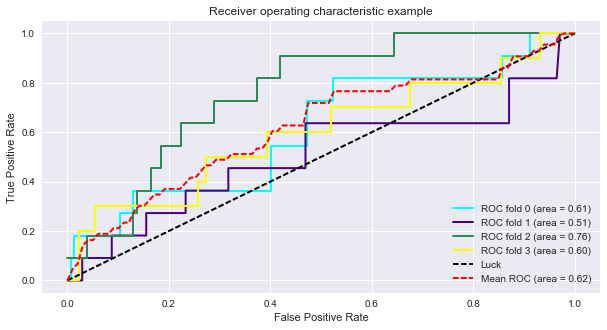

Accuracy: 0.96 (+/- 0.03)
F1 score: 0.53 (+/- 0.08)


E_votes_mean       0.139283
E_com_sum          0.117210
E_votes_num        0.110354
E_likes_std        0.093042
E_votes_std        0.089055
E_dislikes_sum     0.077817
E_likes_sum        0.060619
E_dislikes_std     0.055336
E_com_mean         0.053367
E_com_std          0.050834
E_votes_4          0.038836
E_votes_3          0.031627
E_votes_1          0.030265
E_likes_mean       0.018556
E_votes_2          0.015180
E_com_num          0.009615
E_dislikes_mean    0.009004
dtype: float64

In [303]:
from sklearn.ensemble import GradientBoostingClassifier as GBM
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.over_sampling import SMOTE
ML_features = E_features.copy()

X = ML_features.copy().drop(['E_churn','E_comid'],axis=1).fillna(-1).values
y = ML_features['E_churn'].values.copy()

X_resampled, y_resampled = balancer.fit_sample(X, y)

pipeline.fit(X, y)
feats = pd.Series(index=ML_features.drop(['E_churn','E_comid'],axis=1).columns.values,data=pipeline.steps[3][1].feature_importances_)
cols_E = feats[feats>threshold].sort_values(ascending=False).index[:5].values.tolist()
scores = cross_val_score(pipeline,X, y, cv=cv)
draw_roc_cv(clf,X,y,average='macro',cv=cv)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
scores_f1 = cross_val_score(pipeline,X, y, cv=cv, scoring='f1_macro')
print("F1 score: %0.2f (+/- %0.2f)" % (scores_f1.mean(), scores_f1.std() * 2))

feats.sort_values(ascending=False)
#ML_features = pd.merge(ML_features,E_features[['E_churn','E_comid']],left_index=True,right_index=True,how='outer')

## Company-employee features

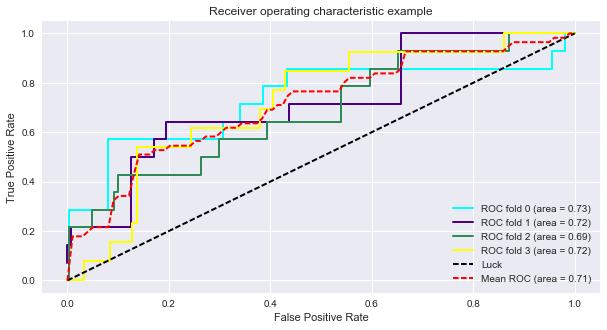

Accuracy: 0.95 (+/- 0.02)
F1 score: 0.58 (+/- 0.12)


CE_com_mean         0.126254
CE_dislikes_std     0.112451
CE_votes_std        0.111764
CE_votes_mean       0.107115
CE_votes_num        0.083671
CE_com_sum          0.081602
CE_likes_sum        0.078295
CE_likes_std        0.063611
CE_com_std          0.055622
CE_votes_4          0.032879
CE_votes_2          0.026981
CE_votes_1          0.026699
CE_votes_3          0.023917
CE_dislikes_sum     0.023383
CE_dislikes_mean    0.015934
CE_com_num          0.015461
CE_likes_mean       0.014362
dtype: float64

In [304]:
ML_features = CE_features.copy()
ML_features = pd.merge(ML_features,E_features[['E_churn','E_comid',
                                               'E_votes_num','E_likes_sum','E_dislikes_sum']],left_index=True,right_index=True,how='outer')

X = ML_features.copy().drop(['E_churn','E_comid','E_votes_num','E_likes_sum','E_dislikes_sum'],axis=1).fillna(-1).values
y = ML_features['E_churn'].values.copy()

feats = pd.Series(index=ML_features.drop(['E_churn','E_comid','E_votes_num','E_likes_sum','E_dislikes_sum'],axis=1).columns.values,data=pipeline.steps[3][1].feature_importances_)
cols_CE = feats[feats>threshold].sort_values(ascending=False).index[:20].values.tolist()
scores = cross_val_score(pipeline,X, y, cv=cv)
draw_roc_cv(pipeline,X,y,average='macro',cv=cv)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
scores_f1 = cross_val_score(pipeline,X, y, cv=cv, scoring='f1_macro')
print("F1 score: %0.2f (+/- %0.2f)" % (scores_f1.mean(), scores_f1.std() * 2))
feats.sort_values(ascending=False)



## Employee Graph-based features

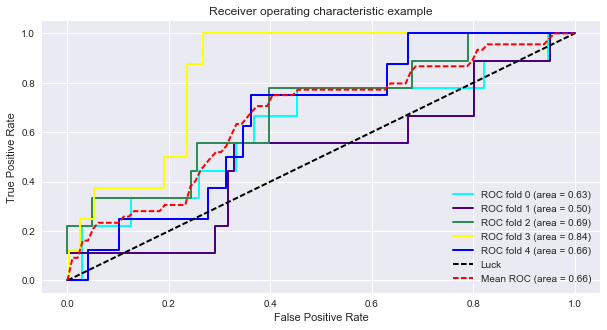

Accuracy: 0.95 (+/- 0.03)
F1 score: 0.56 (+/- 0.14)


CE_G_interactions_NMF1_d    0.191722
CE_G_rel_agree_NMF1_u       0.172276
CE_G_interactions_NMF2_u    0.153594
CE_G_rel_agree_NMF1_d       0.138414
CE_G_rel_agree_NMF2_d       0.108107
CE_G_interactions_NMF1_u    0.099973
CE_G_interactions_NMF2_d    0.074859
CE_G_rel_agree_NMF2_u       0.061055
dtype: float64

In [352]:
ML_features = NMF_df.copy().drop('companyAlias',axis=1)
ML_features = pd.merge(ML_features,E_features[['E_churn','E_comid',
                                               'E_votes_num','E_likes_sum','E_dislikes_sum']],left_index=True,right_index=True,how='outer')

X = ML_features.copy().drop(['E_churn','E_comid','E_votes_num','E_likes_sum','E_dislikes_sum'],axis=1).fillna(-1).values
y = ML_features['E_churn'].values.copy()

pipeline.fit(X,y)
feats = pd.Series(index=ML_features.drop(['E_churn','E_comid','E_votes_num','E_likes_sum','E_dislikes_sum'],axis=1).columns.values,data=pipeline.steps[3][1].feature_importances_)
cols_E_G = feats[feats>threshold].sort_values(ascending=False).index[:3].values.tolist()
scores = cross_val_score(pipeline,X, y, cv=cv)
draw_roc_cv(pipeline,X, y,average='macro',cv=cv)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
scores_f1 = cross_val_score(pipeline,X, y, cv=cv, scoring='f1_macro')
print("F1 score: %0.2f (+/- %0.2f)" % (scores_f1.mean(), scores_f1.std() * 2))
feats.sort_values(ascending=False)

# Employee-Company graph features

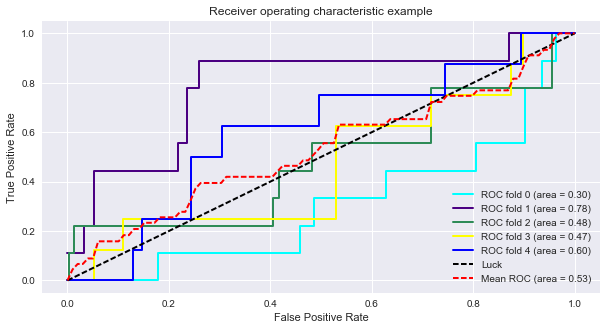

Accuracy: 0.92 (+/- 0.15)
F1 score: 0.51 (+/- 0.09)


CE_G_rel_agree_NMF2_u       0.149168
CE_G_rel_agree_NMF2_d       0.131910
CE_G_rel_agree_NMF1_d       0.127875
CE_G_rel_agree_NMF1_u       0.126601
CE_G_interactions_NMF2_d    0.123599
CE_G_interactions_NMF1_u    0.121120
CE_G_interactions_NMF1_d    0.111322
CE_G_interactions_NMF2_u    0.108405
dtype: float64

In [350]:
ML_features = r_NMFD.copy()
ML_features = pd.merge(ML_features,E_features[['E_churn','E_comid',
                                               'E_votes_num','E_likes_sum','E_dislikes_sum']],left_index=True,right_index=True,how='outer')

X = ML_features.copy().drop(['E_churn','E_comid','E_votes_num','E_likes_sum','E_dislikes_sum'],axis=1).fillna(-1).values
y = ML_features['E_churn'].values.copy()

pipeline.fit(X, y )
feats = pd.Series(index=ML_features.drop(['E_churn','E_comid','E_votes_num','E_likes_sum','E_dislikes_sum'],axis=1).columns.values,data=pipeline.steps[3][1].feature_importances_)
cols_CE_G = feats[feats>threshold].sort_values(ascending=False).index[:20].values.tolist()
scores = cross_val_score(pipeline,X, y, cv=cv)
draw_roc_cv(pipeline,X, y,average='macro',cv=cv)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
scores_f1 = cross_val_score(pipeline,X, y, cv=cv, scoring='f1_macro')
print("F1 score: %0.2f (+/- %0.2f)" % (scores_f1.mean(), scores_f1.std() * 2))
feats.sort_values(ascending=False)

In [309]:
df.columns.values

array(['E_churn', 'CE_com_mean', 'CE_dislikes_std', 'CE_votes_std',
       'CE_votes_mean', 'CE_com_sum', 'CE_votes_num', 'CE_likes_sum',
       'CE_likes_std', 'CE_com_std', 'CE_votes_4', 'CE_votes_1',
       'CE_votes_3', 'CE_votes_2', 'CE_com_num', 'CE_dislikes_sum'], dtype=object)

# GBM with most significant features

In [311]:
df.columns.values

array(['E_churn', 'CE_com_mean', 'CE_dislikes_std', 'CE_votes_std',
       'CE_votes_mean', 'CE_com_sum', 'CE_votes_num', 'CE_likes_sum',
       'CE_likes_std', 'CE_com_std', 'CE_votes_4', 'CE_votes_1',
       'CE_votes_3', 'CE_votes_2', 'CE_com_num', 'CE_dislikes_sum'], dtype=object)

In [322]:
ML_features = pd.merge(CE_features,E_features,left_index=True,right_index=True,how='outer')
#ML_features = pd.merge(ML_features,E_features[['E_churn','E_comid',
#                                               'E_votes_num','E_likes_sum','E_dislikes_sum']],left_index=True,right_index=True,how='outer')
ML_features = pd.merge(ML_features,CE_G_features,left_index=True,right_index=True,how='outer')
ML_features = pd.merge(ML_features,E_G_features,left_index=True,right_index=True,how='outer')
#ML_features = pd.merge(ML_features,E_features[['E_churn','E_comid']],left_index=True,right_index=True,how='outer')


cols = ['E_churn']+cols_CE_G+cols_E#+cols_E+cols_CE_G#+cols_E_G
df = ML_features.loc[:,cols].copy()#pd.read_pickle('data_ml/features_df.pck')
X = df.drop(['E_churn'],axis=1).fillna(0).values.copy()
y = df['E_churn'].values.copy()

In [323]:
cols_CE_G

['CE_G_interactions_NMF1_d',
 'CE_G_rel_agree_NMF1_u',
 'CE_G_interactions_NMF2_u',
 'CE_G_rel_agree_NMF1_d',
 'CE_G_rel_agree_NMF2_d',
 'CE_G_interactions_NMF1_u',
 'CE_G_interactions_NMF2_d',
 'CE_G_rel_agree_NMF2_u']

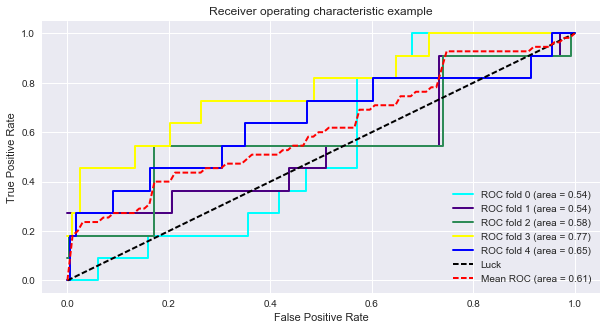

Accuracy: 0.95 (+/- 0.03)
F1 score: 0.60 (+/- 0.14)


In [324]:
from sklearn.model_selection import cross_val_score

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
clf = RandomForestClassifier()
#clf = GBM(n_estimators=200,subsample=0.9,max_features="log2")#(min_samples_split=2,min_samples_leaf=1,subsample=0.5,n_estimators=3000,max_depth=8)
#clf = svm.SVC(kernel='linear', probability=True,
#                         random_state=10)
cnn = CondensedNearestNeighbour()
X_resampled, y_resampled = balancer.fit_sample(X, y)
cv = 5
scores = cross_val_score(pipeline,X, y, cv=cv)
draw_roc_cv(pipeline,X, y,average='macro',cv=cv)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
scores_f1 = cross_val_score(pipeline,X, y, cv=cv, scoring='f1_macro')
print("F1 score: %0.2f (+/- %0.2f)" % (scores_f1.mean(), scores_f1.std() * 2))


# Confusion matrix

array([[244,   2],
       [  3,   9]])

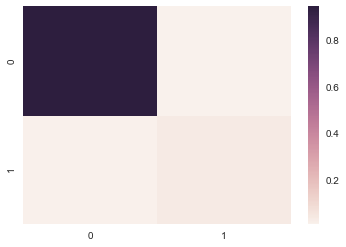

In [325]:
%matplotlib inline
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
cnn = CondensedNearestNeighbour()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
#X_resampled, y_resampled = balancer.fit_sample(X_train, y_train)


y_pred = pipeline.fit(X_train, y_train).predict(X_test)
cmat = confusion_matrix(y_test, y_pred)
sns.heatmap(cmat/cmat.sum())
cmat

In [ ]:
auc?

In [161]:
import numpy as np
from scipy import interp
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, roc_auc_score,auc
from sklearn.model_selection import StratifiedKFold

def draw_roc_cv(clf,X,y,average='micro',cv=10):
    # Run classifier with cross-validation and plot ROC curves
    cv = StratifiedKFold(n_splits=cv)
    classifier = clf

    mean_tpr = 0.0
    mean_fpr = np.linspace(0, 1, 100)

    colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange','green','grey','magenta','brown'])
    lw = 2

    i = 0
    plt.figure(figsize=(10,5))
    for (train, test), color in zip(cv.split(X, y), colors):
        probas_ = classifier.fit(X[train], y[train]).predict_proba(X[test])
        # Compute ROC curve and area the curve
        fpr, tpr, thresholds = roc_curve(y[test], probas_[:, 1])
        mean_tpr += interp(mean_fpr, fpr, tpr)
        mean_tpr[0] = 0.0
        roc_auc = auc(fpr, tpr)
        _ = plt.plot(fpr, tpr, lw=lw, color=color,
                 label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

        i += 1
    _ = plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
             label='Luck')

    mean_tpr /= cv.get_n_splits(X, y)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    
    _ = plt.plot(mean_fpr, mean_tpr, color='r', linestyle='--',
             label='Mean ROC (area = %0.2f)' % mean_auc, lw=lw)

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()


In [162]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5,shuffle=True)

for train_index, test_index in skf.split(X, y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_pred = clf.fit(X_train,y[train_index]).predict(X_test)
    cmat = confusion_matrix(y[test_index], y_pred)
    print(cmat)

[[247   0]
 [  5   6]]
[[245   2]
 [  7   4]]
[[245   2]
 [ 10   1]]
[[246   1]
 [  6   5]]
[[244   2]
 [  3   8]]


In [32]:
from gpbokeh import *

In [37]:
%%HTML
<style>
.container{width:90% !important;}
</style>

In [33]:
g_ml = g_total.copy()

#feats,g_ml = calculate_graph_features(g_ml,r_NMFD.copy())
g_ml = add_info_to_graph(pd.read_pickle('NMF_data_eval.pck'),g_ml)

#g_ml = add_info_to_graph(df,g_ml)

In [32]:
data_l = pd.merge(r_NMFD.copy(),E_features,right_index=True,left_index=True,how='left').to_pickle('NMF_data_eval.pck')


NameError: name 'r_NMFD' is not defined

In [36]:
gc = GraphCalculator(g_ml,metrics=False)

In [37]:
def clean_node(x):
    if isinstance(x,dict):
        return list(x.values())[0]
    else:
        return x

gc.edge = gc.edge.applymap(clean_node).copy()
gc.node = gc.node.applymap(clean_node).copy()

In [38]:
gp = GraphPlotBokeh(gc)
gp._plot_title = ""

In [41]:
gp.load_data()
#gp._plot_title = "Likes NMF Community 1"
#gp.init_plot()
gp.widget

In [45]:
import pickle
with open('bokeh/rel_agree_3.pck','wb') as f:
    pickle.dump(gp.snapshot.value,f)

In [33]:
with open('bokeh/churn_happyness.pck','rb') as f:
    dataset = pickle.load(f)

In [36]:
from IPython.core.display import HTML
HTML(dataset)

In [35]:
import pickle
from IPython.core.display import HTML
from bokeh.plotting import output_notebook
output_notebook()

Loading BokehJS ...

In [30]:
import pickle
with open('bokeh/interactions_happyness.pck','wb') as f:
    pickle.dump(gp.snapshot.value,f)

NameError: name 'gp' is not defined

In [205]:
df.to_csv("features_ml/ML_features.csv")
E_features.to_csv("features_ml/E_features.csv")
E_G_features.to_csv("features_ml/E_G_features.csv")
CE_features.to_csv("features_ml/CE_features.csv")
CE_G_features.to_csv("features_ml/CE_G_features.csv")